In [1]:
from __future__ import division, print_function
import sys, os, glob, gc, warnings
import numpy as np
from astropy.table import Table, vstack, hstack, join
import fitsio
import matplotlib.pyplot as plt

import healpy as hp

In [2]:
params = {'legend.fontsize': 'x-large',
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large',
         'figure.facecolor':'w'} 
plt.rcParams.update(params)

plt.rcParams['image.cmap'] = 'seismic'

In [3]:
pix_scale = 2.75 # WISE coadd pixel size

# Convert to AB nmgy per pixel
w1_to_ab = 10**(-2.699/2.5)
w2_to_ab = 10**(-3.339/2.5)
print(w1_to_ab, w2_to_ab)

0.08325302067492427 0.046174265947729554


In [4]:
north = Table.read('/Users/rongpu/Documents/Data/desi_misc/sky_residuals/survey_bricks_wise_sky_residuals-dr9_north.fits')
south = Table.read('/Users/rongpu/Documents/Data/desi_misc/sky_residuals/survey_bricks_wise_sky_residuals-dr9_south.fits')

In [5]:
north['w1_median_ab'] = north['w1_median']*w1_to_ab/pix_scale**2
north['w2_median_ab'] = north['w2_median']*w2_to_ab/pix_scale**2
south['w1_median_ab'] = south['w1_median']*w1_to_ab/pix_scale**2
south['w2_median_ab'] = south['w2_median']*w2_to_ab/pix_scale**2

In [6]:
mask = (north['DEC']>32.375) & ((north['RA']>60) & (north['RA']<300))
mask &= (north['w1_median']!=-99) & (north['w2_median']!=-99)
north = north[mask]
print(len(north))
mask = ((south['DEC']<=32.375) | (~((south['RA']>60) & (south['RA']<300)))) & (south['DEC']>-28)
mask &= (south['w1_median']!=-99) & (south['w2_median']!=-99)
south = south[mask]
print(len(south))

82880
191592


__Add DR8 WISE_NOBS info__

In [7]:
bricks_north = Table.read('/Users/rongpu/Documents/Data/dr8/survey-bricks-dr8-north.fits.gz')
bricks_north.rename_column('brickname', 'BRICKNAME')
mask = np.in1d(bricks_north['BRICKNAME'], north['BRICKNAME'])
print(np.sum(mask), len(north)-np.sum(mask), len(bricks_north)-np.sum(mask))
north = join(north, bricks_north[['BRICKNAME', 'wise_nobs', 'ebv']], keys='BRICKNAME', join_type='inner')
print(len(north))

bricks_south = Table.read('/Users/rongpu/Documents/Data/dr8/survey-bricks-dr8-south.fits.gz')
bricks_south.rename_column('brickname', 'BRICKNAME')
mask = np.in1d(bricks_south['BRICKNAME'], south['BRICKNAME'])
print(np.sum(mask), len(south)-np.sum(mask), len(bricks_south)-np.sum(mask))
south = join(south, bricks_south[['BRICKNAME', 'wise_nobs', 'ebv']], keys='BRICKNAME', join_type='inner')
print(len(south))

82876 4 10734
82876
186968 4624 60876
186968


In [8]:
cat = vstack([north, south])
mask_north = np.zeros(len(cat), dtype=bool)
mask_north[:len(north)] = True
mask_south = ~mask_north

cat['region'] = '     '
cat['region'][mask_south] = 'south'
cat['region'][mask_north] = 'north'

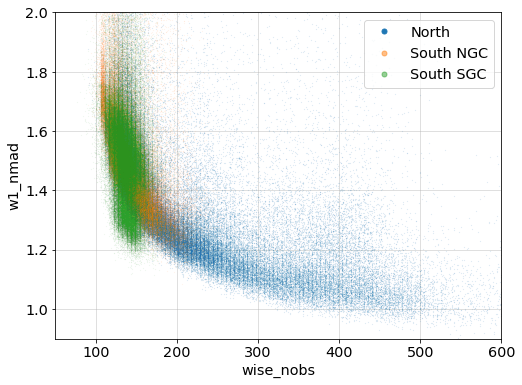

In [11]:
mask1 = mask_south & (cat['RA']>95) & (cat['RA']<290)
mask2 = mask_south & (~((cat['RA']>95) & (cat['RA']<290)))

plt.figure(figsize=(8, 6))
plt.plot(cat['wise_nobs'][mask_north][:, 0], cat['w1_nmad'][mask_north], '.', ms=0.1, alpha=1, label='North')
plt.plot(cat['wise_nobs'][mask1][:, 0], cat['w1_nmad'][mask1], '.', ms=0.1, alpha=0.5, label='South NGC')
plt.plot(cat['wise_nobs'][mask2][:, 0], cat['w1_nmad'][mask2], '.', ms=0.1, alpha=0.5, label='South SGC')
plt.xlabel('wise_nobs')
plt.ylabel('w1_nmad')
plt.grid(alpha=0.5)
plt.axis([50, 600, 0.9, 2.])
plt.legend(markerscale=100)
plt.show()

In [12]:
from astropy import units as u
from astropy.coordinates import SkyCoord

# Convert to the ecliptic coordinates
temp = SkyCoord(ra=cat['RA']*u.degree, dec=cat['DEC']*u.degree, frame='icrs').geocentrictrueecliptic
cat['lambda'], cat['beta'] = np.array(temp.lon), np.array(temp.lat)

In [13]:
# cat.write('/Users/rongpu/Documents/Data/dr9_tests/sky_residuals/dr9_wise_per_brick_residuals.fits')

-------
# W1

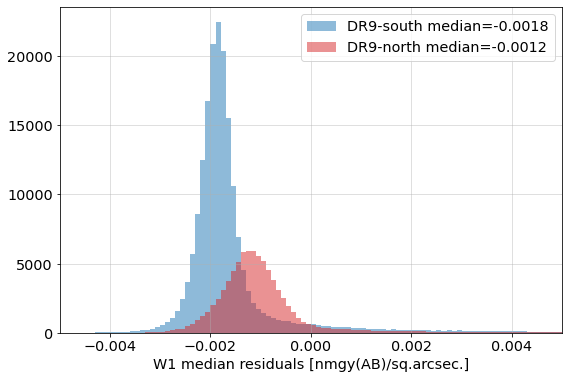

In [14]:
plt.figure(figsize=(9, 6))
v = cat['w1_median_ab'][mask_south]
plt.hist(v, 100, range=(-.005, .005), alpha=0.5, color='C0', label='DR9-south median={:.4f}'.format(np.median(v)), density=False)
v = cat['w1_median_ab'][mask_north]
plt.hist(v, 100, range=(-.005, .005), alpha=0.5, color='C3', label='DR9-north median={:.4f}'.format(np.median(v)), density=False)
plt.grid(alpha=0.5)
plt.xlabel('W1 median residuals [nmgy(AB)/sq.arcsec.]')
plt.xlim(-.005, .005)
plt.legend()
plt.show()

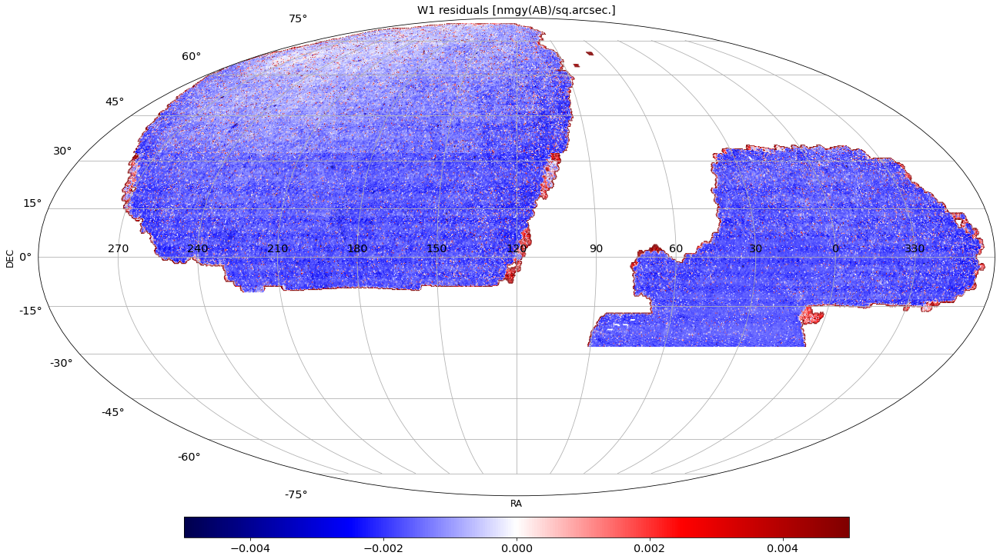

In [15]:
mask = np.ones(len(cat), dtype=bool)
ra, dec, c = cat['RA'][mask], cat['DEC'][mask], cat['w1_median_ab'][mask]
rot = 120

x = np.remainder(ra+360-rot, 360) # shift ra values
x[x>180] -= 360    # scale conversion to [-180, 180]
x = -x
tick_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])
tick_labels = np.remainder(tick_labels+360+rot, 360)
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='mollweide')
im = ax.scatter(np.radians(x), np.radians(dec), c=c, vmin=-0.005, vmax=0.005, s=1.6, edgecolors='none')
ax.set_xticklabels(tick_labels)
ax.set_title(None)
ax.title.set_fontsize(15)
ax.set_xlabel("RA")
ax.xaxis.label.set_fontsize(12)
ax.set_ylabel("DEC")
ax.yaxis.label.set_fontsize(12)
ax.grid(True)
plt.tight_layout()
plt.colorbar(im, orientation="horizontal", fraction=0.04, pad=0.04, aspect=32)
plt.title('W1 residuals [nmgy(AB)/sq.arcsec.]')
plt.savefig('plots/w1.png', dpi=300)
plt.show()

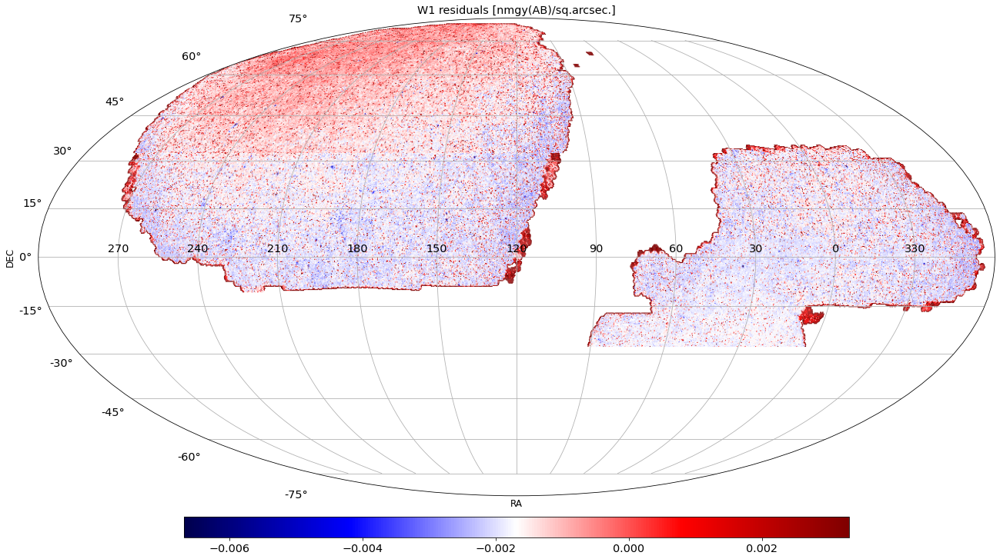

In [16]:
median = np.median(cat['w1_median_ab'])

mask = np.ones(len(cat), dtype=bool)
ra, dec, c = cat['RA'][mask], cat['DEC'][mask], cat['w1_median_ab'][mask]
rot = 120

x = np.remainder(ra+360-rot, 360) # shift ra values
x[x>180] -= 360    # scale conversion to [-180, 180]
x = -x
tick_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])
tick_labels = np.remainder(tick_labels+360+rot, 360)
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='mollweide')
im = ax.scatter(np.radians(x), np.radians(dec), c=c, vmin=-0.005+median, vmax=0.005+median, s=1.6, edgecolors='none')
ax.set_xticklabels(tick_labels)
ax.set_title(None)
ax.title.set_fontsize(15)
ax.set_xlabel("RA")
ax.xaxis.label.set_fontsize(12)
ax.set_ylabel("DEC")
ax.yaxis.label.set_fontsize(12)
ax.grid(True)
plt.tight_layout()
plt.colorbar(im, orientation="horizontal", fraction=0.04, pad=0.04, aspect=32)
plt.title('W1 residuals [nmgy(AB)/sq.arcsec.]')
plt.savefig('plots/w1-cmap_offset.png', dpi=300)
plt.show()

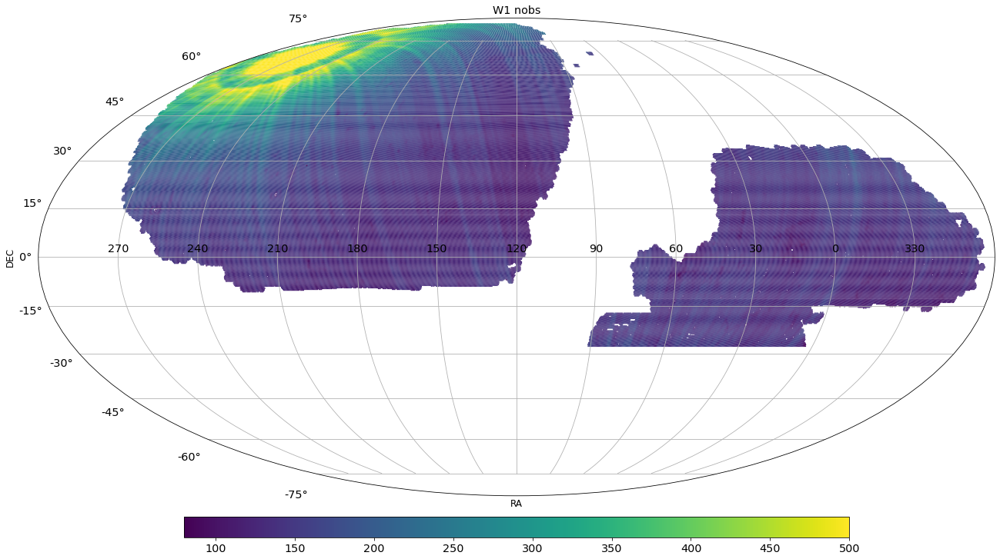

In [142]:
median = np.median(cat['w1_median_ab'])

mask = np.ones(len(cat), dtype=bool)
ra, dec, c = cat['RA'][mask], cat['DEC'][mask], cat['wise_nobs'][:, 0][mask]
rot = 120

x = np.remainder(ra+360-rot, 360) # shift ra values
x[x>180] -= 360    # scale conversion to [-180, 180]
x = -x
tick_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])
tick_labels = np.remainder(tick_labels+360+rot, 360)
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='mollweide')
im = ax.scatter(np.radians(x), np.radians(dec), c=c, vmin=80, vmax=500, s=1.6, edgecolors='none', cmap='viridis')
ax.set_xticklabels(tick_labels)
ax.set_title(None)
ax.title.set_fontsize(15)
ax.set_xlabel("RA")
ax.xaxis.label.set_fontsize(12)
ax.set_ylabel("DEC")
ax.yaxis.label.set_fontsize(12)
ax.grid(True)
plt.tight_layout()
plt.colorbar(im, orientation="horizontal", fraction=0.04, pad=0.04, aspect=32)
plt.title('W1 nobs')
plt.savefig('plots/w1_nobs.png', dpi=300)
plt.show()

-------
# W2

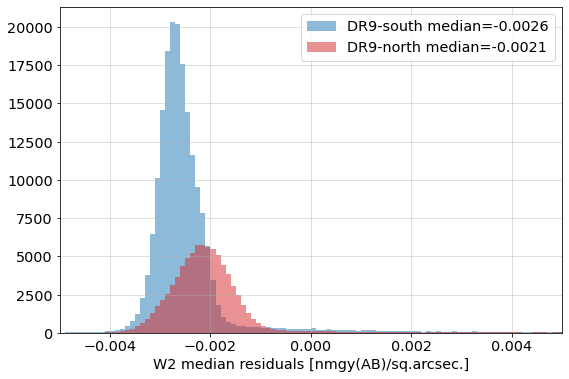

In [17]:
plt.figure(figsize=(9, 6))
v = cat['w2_median_ab'][mask_south]
plt.hist(v, 100, range=(-.005, .005), alpha=0.5, color='C0', label='DR9-south median={:.4f}'.format(np.median(v)), density=False)
v = cat['w2_median_ab'][mask_north]
plt.hist(v, 100, range=(-.005, .005), alpha=0.5, color='C3', label='DR9-north median={:.4f}'.format(np.median(v)), density=False)
plt.grid(alpha=0.5)
plt.xlabel('W2 median residuals [nmgy(AB)/sq.arcsec.]')
plt.xlim(-.005, .005)
plt.legend()
plt.show()

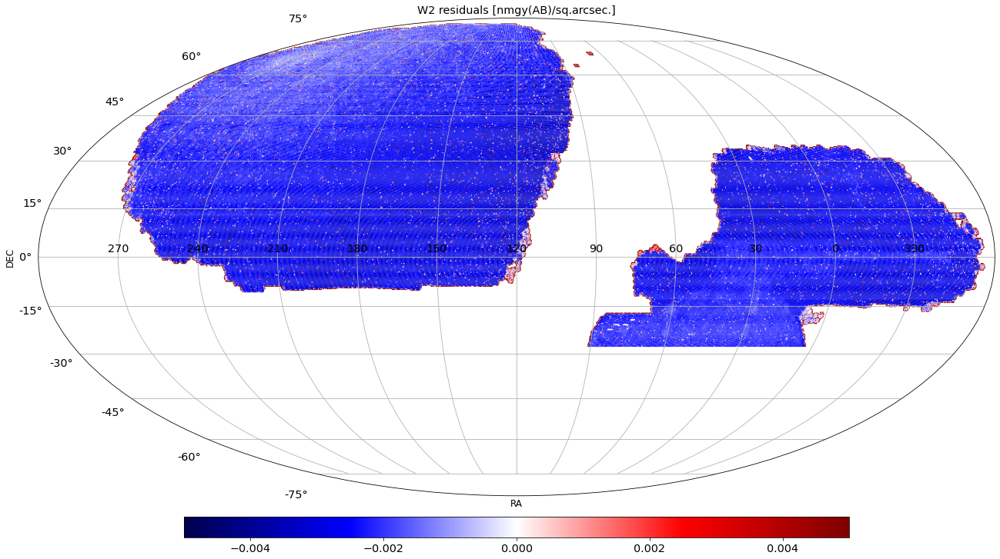

In [19]:
mask = np.ones(len(cat), dtype=bool)
ra, dec, c = cat['RA'][mask], cat['DEC'][mask], cat['w2_median_ab'][mask]
rot = 120

x = np.remainder(ra+360-rot, 360) # shift ra values
x[x>180] -= 360    # scale conversion to [-180, 180]
x = -x
tick_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])
tick_labels = np.remainder(tick_labels+360+rot, 360)
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='mollweide')
im = ax.scatter(np.radians(x), np.radians(dec), c=c, vmin=-0.005, vmax=0.005, s=1.6, edgecolors='none')
ax.set_xticklabels(tick_labels)
ax.set_title(None)
ax.title.set_fontsize(15)
ax.set_xlabel("RA")
ax.xaxis.label.set_fontsize(12)
ax.set_ylabel("DEC")
ax.yaxis.label.set_fontsize(12)
ax.grid(True)
plt.tight_layout()
plt.colorbar(im, orientation="horizontal", fraction=0.04, pad=0.04, aspect=32)
plt.title('W2 residuals [nmgy(AB)/sq.arcsec.]')
plt.savefig('plots/w2.png', dpi=300)
plt.show()

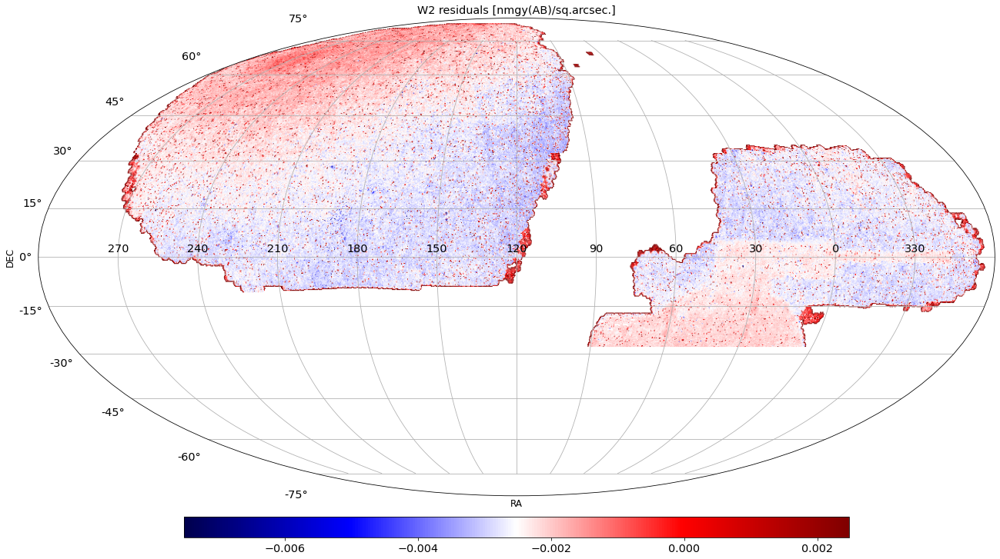

In [20]:
median = np.median(cat['w2_median_ab'])

mask = np.ones(len(cat), dtype=bool)
ra, dec, c = cat['RA'][mask], cat['DEC'][mask], cat['w2_median_ab'][mask]
rot = 120

x = np.remainder(ra+360-rot, 360) # shift ra values
x[x>180] -= 360    # scale conversion to [-180, 180]
x = -x
tick_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])
tick_labels = np.remainder(tick_labels+360+rot, 360)
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='mollweide')
im = ax.scatter(np.radians(x), np.radians(dec), c=c, vmin=-0.005+median, vmax=0.005+median, s=1.6, edgecolors='none')
ax.set_xticklabels(tick_labels)
ax.set_title(None)
ax.title.set_fontsize(15)
ax.set_xlabel("RA")
ax.xaxis.label.set_fontsize(12)
ax.set_ylabel("DEC")
ax.yaxis.label.set_fontsize(12)
ax.grid(True)
plt.tight_layout()
plt.colorbar(im, orientation="horizontal", fraction=0.04, pad=0.04, aspect=32)
plt.title('W2 residuals [nmgy(AB)/sq.arcsec.]')
plt.savefig('plots/w2-cmap_offset.png', dpi=300)
plt.show()

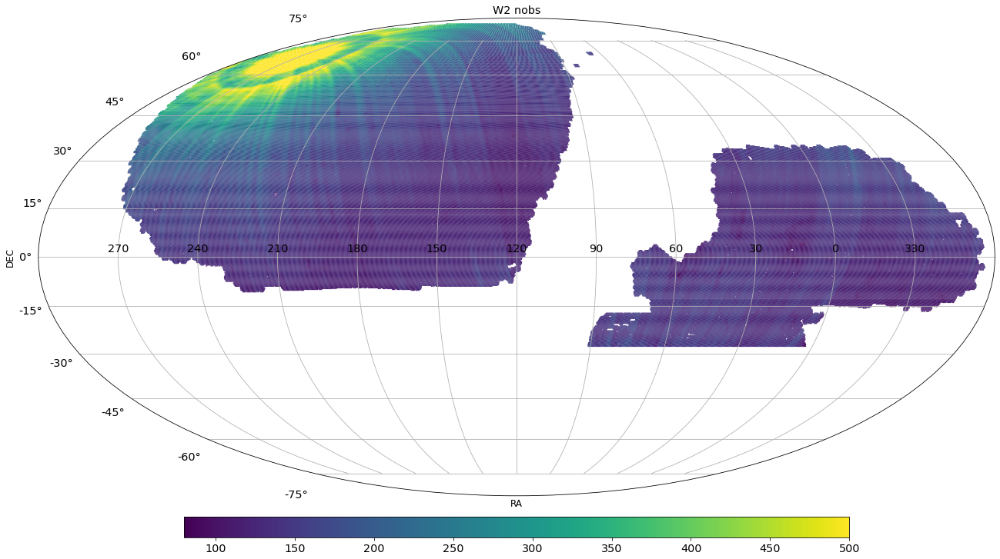

In [143]:
median = np.median(cat['w1_median_ab'])

mask = np.ones(len(cat), dtype=bool)
ra, dec, c = cat['RA'][mask], cat['DEC'][mask], cat['wise_nobs'][:, 1][mask]
rot = 120

x = np.remainder(ra+360-rot, 360) # shift ra values
x[x>180] -= 360    # scale conversion to [-180, 180]
x = -x
tick_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])
tick_labels = np.remainder(tick_labels+360+rot, 360)
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='mollweide')
im = ax.scatter(np.radians(x), np.radians(dec), c=c, vmin=80, vmax=500, s=1.6, edgecolors='none', cmap='viridis')
ax.set_xticklabels(tick_labels)
ax.set_title(None)
ax.title.set_fontsize(15)
ax.set_xlabel("RA")
ax.xaxis.label.set_fontsize(12)
ax.set_ylabel("DEC")
ax.yaxis.label.set_fontsize(12)
ax.grid(True)
plt.tight_layout()
plt.colorbar(im, orientation="horizontal", fraction=0.04, pad=0.04, aspect=32)
plt.title('W2 nobs')
plt.savefig('plots/w2_nobs.png', dpi=300)
plt.show()

-----
## Residual vs ecliptic latitude

In [21]:
from scipy import stats

nmad = lambda x: 1.4826*np.median(np.abs(x-np.median(x)))
error_of_the_mean = lambda x: nmad(x)/np.sqrt(len(x))

def binned_median(x, y, nbins=25):
    vmin, vmax = np.percentile(x, [0.1, 99.9])
    bins = np.linspace(vmin, vmax, nbins)
    bin_median, bin_edges, binnumber = stats.binned_statistic(x, y, statistic='median', bins=bins)
    bin_error, _, _ = stats.binned_statistic(x, y, statistic=error_of_the_mean, bins=bins)    
    bin_center = (bin_edges[1:] + bin_edges[:-1])/2
    return bin_center, bin_edges, bin_median, bin_error

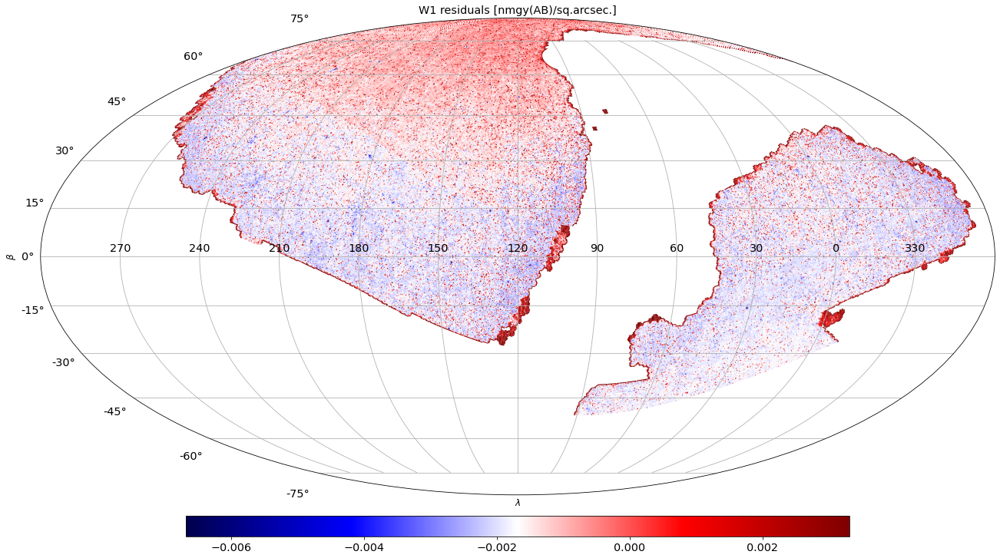

In [22]:
median = np.median(cat['w1_median_ab'])

mask = np.ones(len(cat), dtype=bool)
ra, dec, c = cat['lambda'][mask], cat['beta'][mask], cat['w1_median_ab'][mask]
rot = 120

x = np.remainder(ra+360-rot, 360) # shift ra values
x[x>180] -= 360    # scale conversion to [-180, 180]
x = -x
tick_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])
tick_labels = np.remainder(tick_labels+360+rot, 360)
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='mollweide')
im = ax.scatter(np.radians(x), np.radians(dec), c=c, vmin=-0.005+median, vmax=0.005+median, s=1.6, edgecolors='none')
ax.set_xticklabels(tick_labels)
ax.set_title(None)
ax.title.set_fontsize(15)
ax.set_xlabel(r"$\lambda$")
ax.xaxis.label.set_fontsize(12)
ax.set_ylabel(r"$\beta$")
ax.yaxis.label.set_fontsize(12)
ax.grid(True)
plt.tight_layout()
plt.colorbar(im, orientation="horizontal", fraction=0.04, pad=0.04, aspect=32)
plt.title('W1 residuals [nmgy(AB)/sq.arcsec.]')
# plt.savefig('plots/w1-cmap_offset.png', dpi=300)
plt.show()

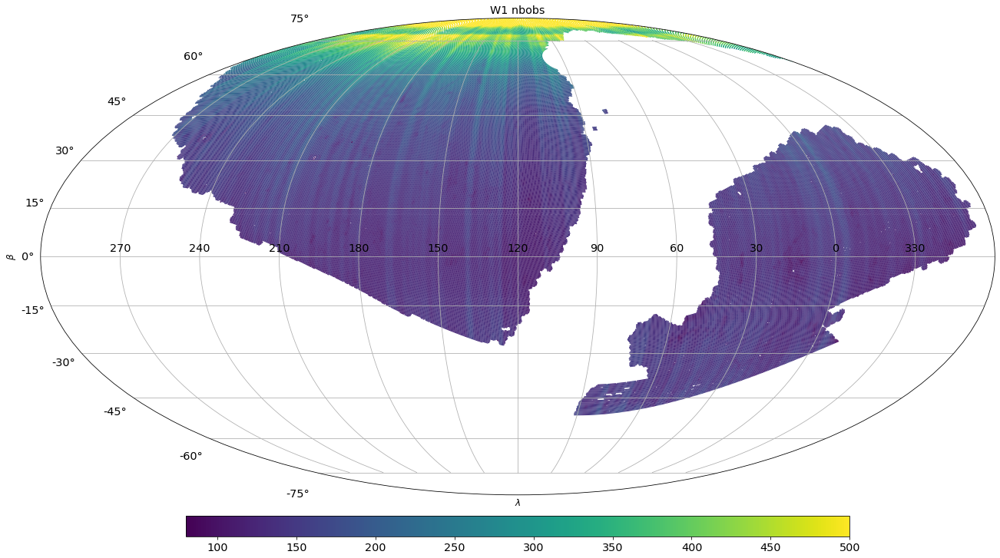

In [149]:
mask = np.ones(len(cat), dtype=bool)
ra, dec, c = cat['lambda'][mask], cat['beta'][mask], cat['wise_nobs'][:, 0][mask]
rot = 120

x = np.remainder(ra+360-rot, 360) # shift ra values
x[x>180] -= 360    # scale conversion to [-180, 180]
x = -x
tick_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])
tick_labels = np.remainder(tick_labels+360+rot, 360)
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='mollweide')
im = ax.scatter(np.radians(x), np.radians(dec), c=c, vmin=80, vmax=500, s=1.6, edgecolors='none', cmap='viridis')
ax.set_xticklabels(tick_labels)
ax.set_title(None)
ax.title.set_fontsize(15)
ax.set_xlabel(r"$\lambda$")
ax.xaxis.label.set_fontsize(12)
ax.set_ylabel(r"$\beta$")
ax.yaxis.label.set_fontsize(12)
ax.grid(True)
plt.tight_layout()
plt.colorbar(im, orientation="horizontal", fraction=0.04, pad=0.04, aspect=32)
plt.title('W1 nbobs')
# plt.savefig('plots/w1-cmap_offset.png', dpi=300)
plt.show()

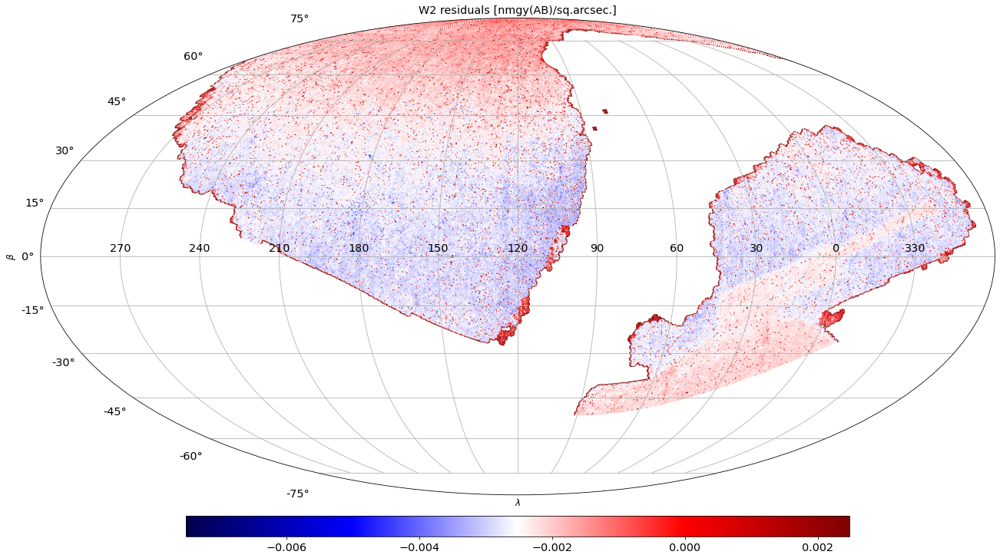

In [23]:
median = np.median(cat['w2_median_ab'])

mask = np.ones(len(cat), dtype=bool)
ra, dec, c = cat['lambda'][mask], cat['beta'][mask], cat['w2_median_ab'][mask]
rot = 120

x = np.remainder(ra+360-rot, 360) # shift ra values
x[x>180] -= 360    # scale conversion to [-180, 180]
x = -x
tick_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])
tick_labels = np.remainder(tick_labels+360+rot, 360)
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='mollweide')
im = ax.scatter(np.radians(x), np.radians(dec), c=c, vmin=-0.005+median, vmax=0.005+median, s=1.6, edgecolors='none')
ax.set_xticklabels(tick_labels)
ax.set_title(None)
ax.title.set_fontsize(15)
ax.set_xlabel(r"$\lambda$")
ax.xaxis.label.set_fontsize(12)
ax.set_ylabel(r"$\beta$")
ax.yaxis.label.set_fontsize(12)
ax.grid(True)
plt.tight_layout()
plt.colorbar(im, orientation="horizontal", fraction=0.04, pad=0.04, aspect=32)
plt.title('W2 residuals [nmgy(AB)/sq.arcsec.]')
plt.show()

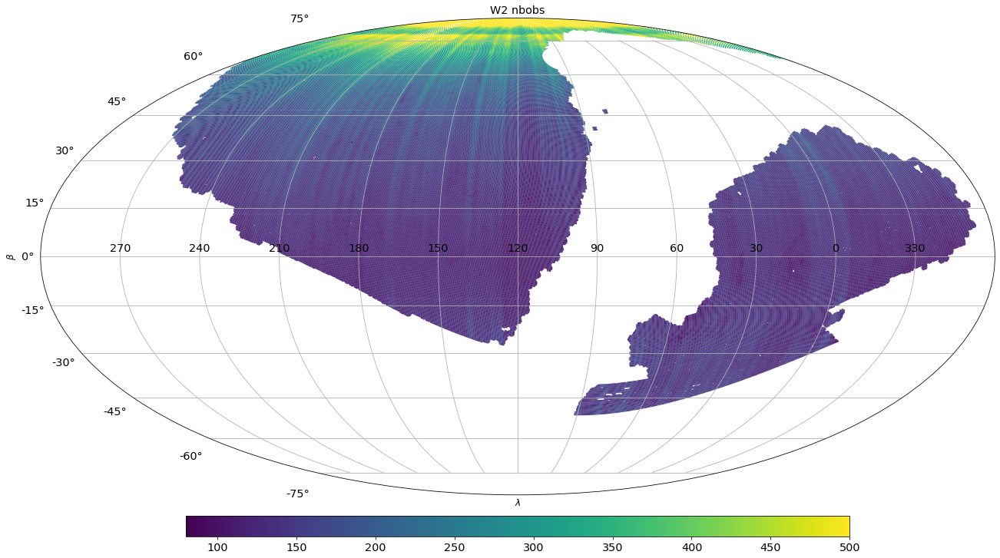

In [150]:
mask = np.ones(len(cat), dtype=bool)
ra, dec, c = cat['lambda'][mask], cat['beta'][mask], cat['wise_nobs'][:, 1][mask]
rot = 120

x = np.remainder(ra+360-rot, 360) # shift ra values
x[x>180] -= 360    # scale conversion to [-180, 180]
x = -x
tick_labels = np.array([150, 120, 90, 60, 30, 0, 330, 300, 270, 240, 210])
tick_labels = np.remainder(tick_labels+360+rot, 360)
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='mollweide')
im = ax.scatter(np.radians(x), np.radians(dec), c=c, vmin=80, vmax=500, s=1.6, edgecolors='none', cmap='viridis')
ax.set_xticklabels(tick_labels)
ax.set_title(None)
ax.title.set_fontsize(15)
ax.set_xlabel(r"$\lambda$")
ax.xaxis.label.set_fontsize(12)
ax.set_ylabel(r"$\beta$")
ax.yaxis.label.set_fontsize(12)
ax.grid(True)
plt.tight_layout()
plt.colorbar(im, orientation="horizontal", fraction=0.04, pad=0.04, aspect=32)
plt.title('W2 nbobs')
plt.show()

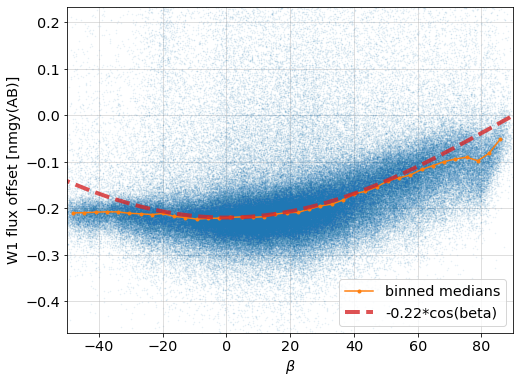

In [121]:
x = np.linspace(-89, 89, 1000)
y = -0.22*np.cos(np.radians(x))
nea = 117.

mask = np.ones(len(cat), dtype=bool)
bin_center, bin_edges, bin_median, bin_error = binned_median(cat['beta'][mask], nea*cat['w1_median_ab'][mask], nbins=40)
plt.figure(figsize=(8, 6))
plt.plot(cat['beta'][mask], nea*cat['w1_median_ab'][mask], '.', ms=1, alpha=0.1)
plt.plot(bin_center, bin_median, '.-', label='binned medians')
plt.plot(x, y, 'C3--', lw=4, label='-0.22*cos(beta)', alpha=0.8)
plt.grid(alpha=0.5)
plt.axis([-50, 90, nea*-0.004, nea*0.002])
plt.xlabel(r"$\beta$")
plt.ylabel('W1 flux offset [nmgy(AB)]')
plt.legend()
plt.show()

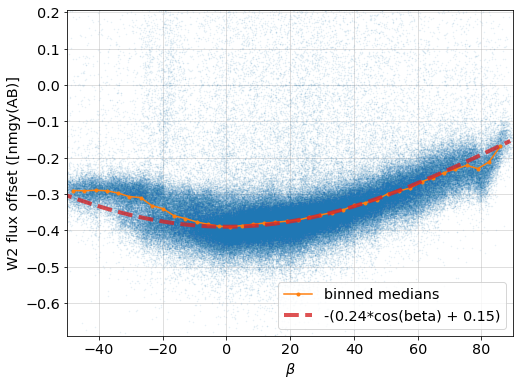

In [122]:
x = np.linspace(-89, 89, 1000)
y = -(0.24*np.cos(np.radians(x)) + 0.15)
nea = 138.

mask = np.ones(len(cat), dtype=bool)
bin_center, bin_edges, bin_median, bin_error = binned_median(cat['beta'][mask], nea*cat['w2_median_ab'][mask], nbins=40)
plt.figure(figsize=(8, 6))
plt.plot(cat['beta'][mask], nea*cat['w2_median_ab'][mask], '.', ms=1, alpha=0.1)
plt.plot(bin_center, bin_median, '.-', label='binned medians')
plt.plot(x, y, 'C3--', lw=4, label='-(0.24*cos(beta) + 0.15)', alpha=0.8)
plt.grid(alpha=0.5)
plt.axis([-50, 90, nea*-0.005, nea*0.0015])
plt.xlabel(r"$\beta$")
plt.ylabel('W2 flux offset ([nmgy(AB)]')
plt.legend()
plt.show()

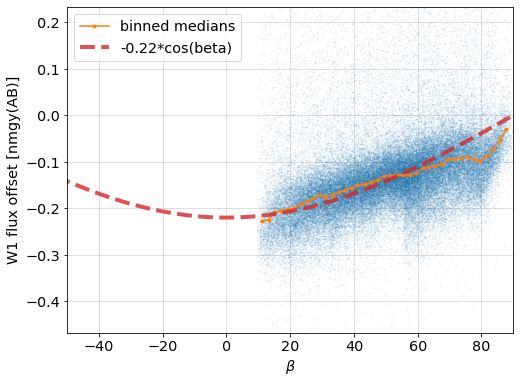

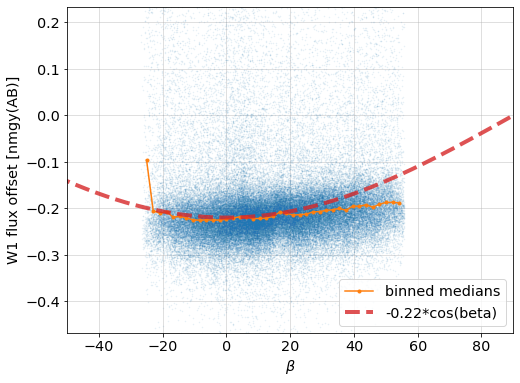

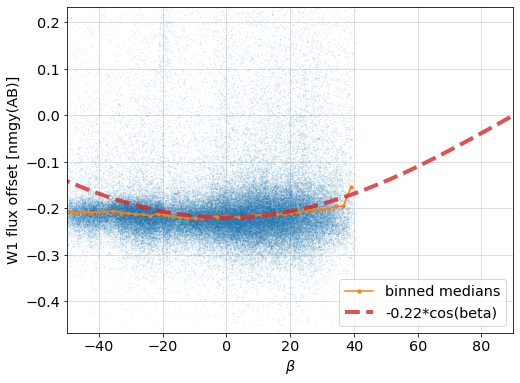

In [125]:
x = np.linspace(-89, 89, 1000)
y = -0.22*np.cos(np.radians(x))
nea = 117.

mask = mask_north
bin_center, bin_edges, bin_median, bin_error = binned_median(cat['beta'][mask], nea*cat['w1_median_ab'][mask], nbins=40)
plt.figure(figsize=(8, 6))
plt.plot(cat['beta'][mask], nea*cat['w1_median_ab'][mask], '.', ms=1, alpha=0.1)
plt.plot(bin_center, bin_median, '.-', label='binned medians')
plt.plot(x, y, 'C3--', lw=4, label='-0.22*cos(beta)', alpha=0.8)
plt.grid(alpha=0.5)
plt.axis([-50, 90, nea*-0.004, nea*0.002])
plt.xlabel(r"$\beta$")
plt.ylabel('W1 flux offset [nmgy(AB)]')
plt.legend()
plt.show()

mask = mask1
bin_center, bin_edges, bin_median, bin_error = binned_median(cat['beta'][mask], nea*cat['w1_median_ab'][mask], nbins=40)
plt.figure(figsize=(8, 6))
plt.plot(cat['beta'][mask], nea*cat['w1_median_ab'][mask], '.', ms=1, alpha=0.1)
plt.plot(bin_center, bin_median, '.-', label='binned medians')
plt.plot(x, y, 'C3--', lw=4, label='-0.22*cos(beta)', alpha=0.8)
plt.grid(alpha=0.5)
plt.axis([-50, 90, nea*-0.004, nea*0.002])
plt.xlabel(r"$\beta$")
plt.ylabel('W1 flux offset [nmgy(AB)]')
plt.legend()
plt.show()

mask = mask2
bin_center, bin_edges, bin_median, bin_error = binned_median(cat['beta'][mask], nea*cat['w1_median_ab'][mask], nbins=40)
plt.figure(figsize=(8, 6))
plt.plot(cat['beta'][mask], nea*cat['w1_median_ab'][mask], '.', ms=1, alpha=0.1)
plt.plot(bin_center, bin_median, '.-', label='binned medians')
plt.plot(x, y, 'C3--', lw=4, label='-0.22*cos(beta)', alpha=0.8)
plt.grid(alpha=0.5)
plt.axis([-50, 90, nea*-0.004, nea*0.002])
plt.xlabel(r"$\beta$")
plt.ylabel('W1 flux offset [nmgy(AB)]')
plt.legend()
plt.show()

------
## Residual vs NOBS

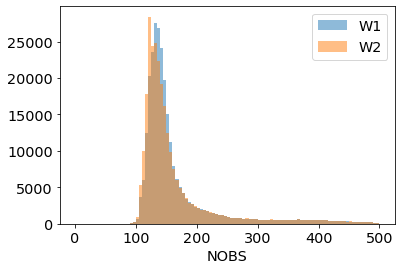

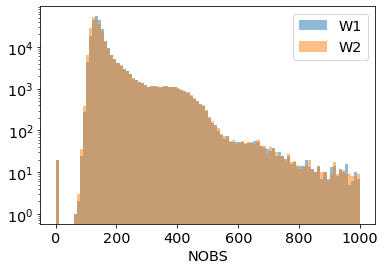

In [137]:
plt.hist(cat['wise_nobs'][:, 0], 100, range=(0, 500), alpha=0.5, label='W1')
plt.hist(cat['wise_nobs'][:, 1], 100, range=(0, 500), alpha=0.5, label='W2')
plt.xlabel('NOBS')
plt.legend()
plt.show()

plt.hist(cat['wise_nobs'][:, 0], 100, range=(0, 1000), alpha=0.5, label='W1', log=True)
plt.hist(cat['wise_nobs'][:, 1], 100, range=(0, 1000), alpha=0.5, label='W2', log=True)
plt.xlabel('NOBS')
plt.legend()
plt.show()

No handles with labels found to put in legend.


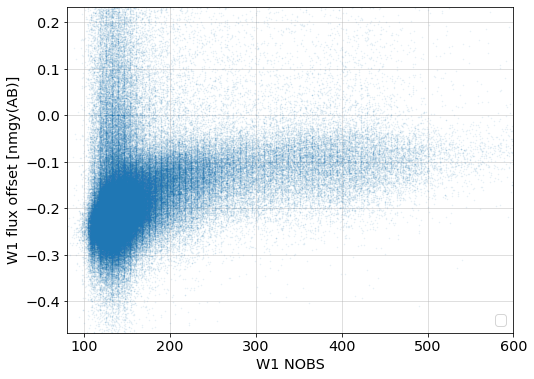

In [138]:
mask = np.ones(len(cat), dtype=bool)
plt.figure(figsize=(8, 6))
plt.plot(cat['wise_nobs'][:, 0][mask], nea*cat['w1_median_ab'][mask], '.', ms=1, alpha=0.1)
# plt.plot(bin_center, bin_median, '.-', label='binned medians')
# plt.plot(x, y, 'C3--', lw=4, label='-0.22*cos(beta)', alpha=0.8)
plt.grid(alpha=0.5)
plt.axis([80, 600, nea*-0.004, nea*0.002])
plt.xlabel('W1 NOBS')
plt.ylabel('W1 flux offset [nmgy(AB)]')
plt.legend()
plt.show()

No handles with labels found to put in legend.


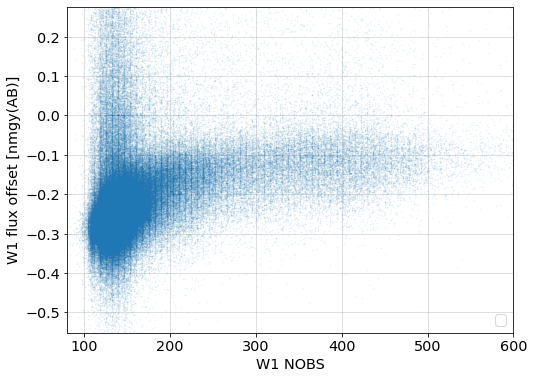

In [69]:
mask = np.ones(len(cat), dtype=bool)
plt.figure(figsize=(8, 6))
plt.plot(cat['wise_nobs'][:, 0][mask], nea*cat['w1_median_ab'][mask], '.', ms=1, alpha=0.1)
# plt.plot(bin_center, bin_median, '.-', label='binned medians')
# plt.plot(x, y, 'C3--', lw=4, label='-0.22*cos(beta)', alpha=0.8)
plt.grid(alpha=0.5)
plt.axis([80, 600, nea*-0.004, nea*0.002])
plt.xlabel('W1 NOBS')
plt.ylabel('W1 flux offset [nmgy(AB)]')
plt.legend()
plt.show()

__Visual inpsection of the outliers__

In [64]:
mask = cat['w1_median_ab']<np.percentile(cat['w1_median_ab'], 0.1)
print(np.sum(mask))
t = Table()
t['RA'] = cat['RA'][mask]
t['DEC'] = cat['DEC'][mask]
t.write('plots/visual_inspection_w1_0.1.fits', overwrite=True)

275


In [63]:
mask = cat['w2_median_ab']<np.percentile(cat['w2_median_ab'], 1)
print(np.sum(mask))
t = Table()
t['RA'] = cat['RA'][mask]
t['DEC'] = cat['DEC'][mask]
t.write('plots/visual_inspection_w2.fits', overwrite=True)

2745


In [13]:
idx = np.where(cat['w1_median_ab']>np.percentile(cat['w1_median_ab'], 95))[0]
idx = np.random.choice(idx, size=1000, replace=False)
print(len(idx))
t = Table()
t['RA'] = cat['RA'][idx]
t['DEC'] = cat['DEC'][idx]
t.write('plots/visual_inspection_w1_95.fits', overwrite=True)

1000


In [15]:
np.percentile(cat['w1_median_ab'], 95)

0.0018086946214558534